In [1]:
%pylab inline
%load_ext autoreload
%autoreload 2

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
images = np.load('/hpcstor6/scratch01/y/y.shah001/Forest_Segmented/Forest_Segmented/Forest_final_img_unm.npy')
masks = np.load('/hpcstor6/scratch01/y/y.shah001/Forest_Segmented/Forest_Segmented/Forest_final_mask_unm.npy')

In [3]:
images.shape

(5108, 512, 512, 1)

In [ ]:
imshow(images[55])

In [5]:
masks.shape

(5108, 512, 512, 1)

In [ ]:
imshow(masks[55])

In [7]:
import sys
sys.path.append('../')
import gp2

In [8]:
from keras import losses

In [9]:
loss_fx = losses.BCE

In [10]:
C = gp2.KUC_UNet2D(loss=loss_fx)

*** GP2  KUC U-Net2D ***
Working directory: /tmp/tmp04jvqn1nkuc_unet2d


In [11]:
hist = C.train(images[0:4088], masks[0:4088], images[4088:5108], masks[4088:5108], batch_size=16, patience_counter=4)

Epoch 1/100
256/256 [==============================] - 88s 302ms/step - loss: 0.6897 - dice_coeff: 0.5821 - val_loss: 0.6418 - val_dice_coeff: 0.6041
Epoch 2/100
256/256 [==============================] - 69s 271ms/step - loss: 0.6179 - dice_coeff: 0.6394 - val_loss: 0.5479 - val_dice_coeff: 0.6933
Epoch 3/100
256/256 [==============================] - 69s 271ms/step - loss: 0.5928 - dice_coeff: 0.6713 - val_loss: 0.5467 - val_dice_coeff: 0.6941
Epoch 4/100
256/256 [==============================] - 70s 272ms/step - loss: 0.5899 - dice_coeff: 0.6735 - val_loss: 0.5472 - val_dice_coeff: 0.7120
Epoch 5/100
256/256 [==============================] - 69s 271ms/step - loss: 0.5919 - dice_coeff: 0.6734 - val_loss: 0.5533 - val_dice_coeff: 0.6815
Epoch 6/100
256/256 [==============================] - 69s 271ms/step - loss: 0.5865 - dice_coeff: 0.6751 - val_loss: 0.5451 - val_dice_coeff: 0.7051
Epoch 7/100
256/256 [==============================] - 69s 271ms/step - loss: 0.5862 - dice_coeff: 0

In [12]:
def visualize_predictions(model, images, masks, num_samples=100):
    for i in range(num_samples):
        x_val, y_val = images[i], masks[i]
        y_pred, _ = model.predict(x_val[np.newaxis, ...], y_val[np.newaxis, ...])

        # Draw the input image, true mask, and predicted mask
        fig, ax = plt.subplots(nrows=1, ncols=3)
        
        ax[0].imshow(x_val)
        ax[0].title.set_text('Input Image')

        ax[1].imshow(y_val.squeeze(), cmap='gray')
        ax[1].title.set_text('True Mask')

        ax[2].imshow(y_pred.squeeze(), cmap='gray')
        ax[2].title.set_text('Predicted Mask')

        plt.show()

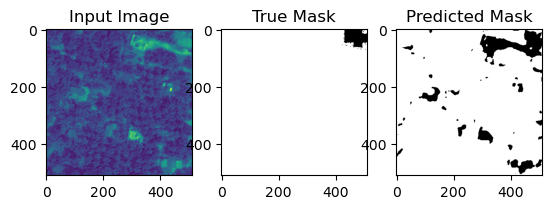

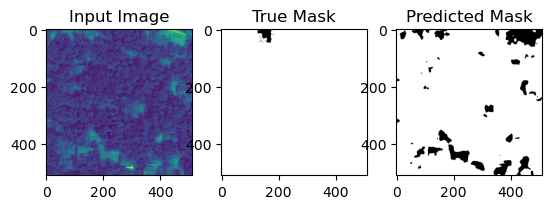

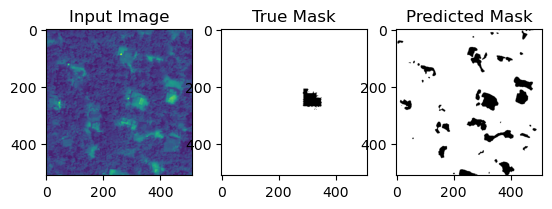

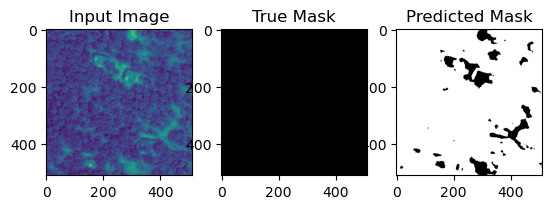

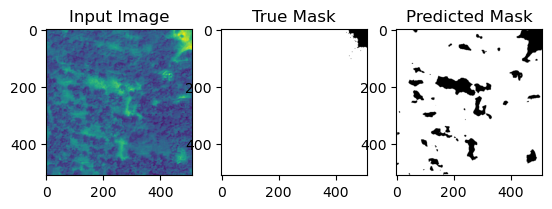

...

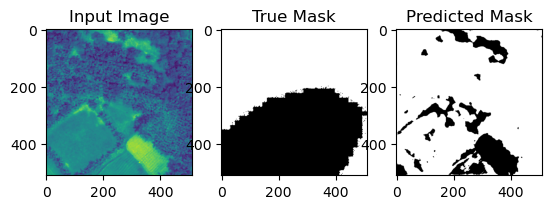

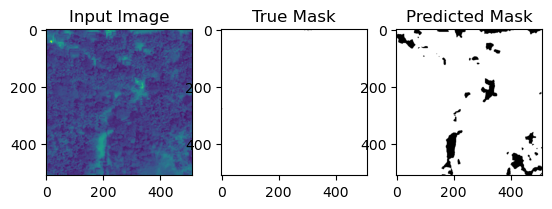

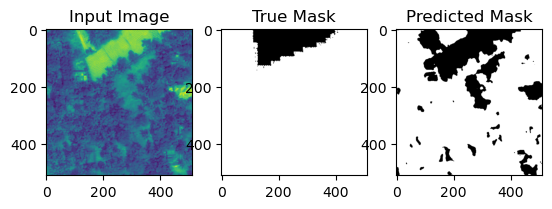

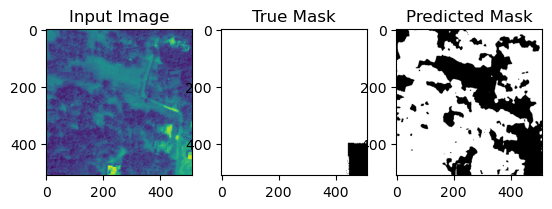

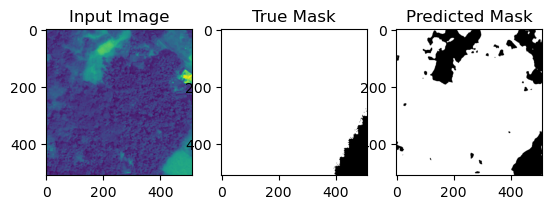

In [ ]:
visualize_predictions(C, images[1000:1500], masks[1000:1500], num_samples=200)